# Grating coupler for Gaussian source (Gs)

Plane source作为入射光源，通过Grating coupler耦合到波导中，验证grating coupler逆向耦合

In [2]:
import meep as mp
import math
import matplotlib.pyplot as plt
import numpy as np
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

plt.style.use("seaborn")
# mp.verbosity(0)

/tmp/ipykernel_956/4267771121.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


## Grating coupler simulation Configuration

<Axes: xlabel='X', ylabel='Y'>

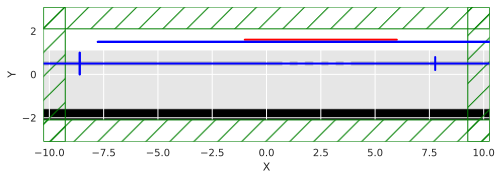

In [20]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid

# thickness of PML
dpml = 1

##################### length parameter ################
input_wvg_length = 10
output_wvg_length = 5

# period = 0.707  # period of grating coupler
period = 0  # period of grating coupler
duty_cycle = 0  # duty cycle of grating coupler
period_2 = 0.707  # period of grating coupler
duty_cycle_2 = 0.53  # duty cycle of grating coupler
number_period = 5  # number of period of grating coupler
sx = (
    input_wvg_length
    + period * number_period
    + period_2 * number_period
    + output_wvg_length
    + 2 * dpml
)

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 1
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

plane_y = 0.5 * sy - dpml - 0.5 * near_field_height
plane_x = -0.5 * sx + input_wvg_length + 0.5 * (period_2 + period) * number_period + dpml
source_x = 7

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)

####################### geometry ##########################
Substrate_geo = mp.Block(
    material=Si,
    center=mp.Vector3(y=-0.5 * sy + 0.5 * Substrate_thickness + dpml),
    size=mp.Vector3(sx, Substrate_thickness),
)
BOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(y=-0.5 * sy + Substrate_thickness + 0.5 * BOX_thickness + dpml),
    size=mp.Vector3(sx, BOX_thickness),
)
TOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(
        y=-0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * TOX_thickness + dpml
    ),
    size=mp.Vector3(sx, TOX_thickness),
)
input_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        -0.5 * sx + 0.5 * input_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(input_wvg_length + 2 * dpml, h),
)
output_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        0.5 * sx - 0.5 * output_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(output_wvg_length + 2 * dpml, h),
)

grating_coupler_geo = []
for ii in range(1, number_period + 1):
    grating_coupler_geo.append(
        mp.Block(
            material=SiN,
            center=mp.Vector3(
                -0.5 * sx
                + input_wvg_length
                + ii * period
                - duty_cycle * period / 2
                + dpml,
                -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
            ),
            size=mp.Vector3(duty_cycle * period, h),
        )
    )

grating_coupler_geo_2 = []
for ii in range(1, number_period + 1):
    grating_coupler_geo_2.append(
        mp.Block(
            material=SiN,
            center=mp.Vector3(
                -0.5 * sx
                + input_wvg_length
                + number_period * period
                + ii * period_2
                - duty_cycle_2 * period_2 / 2
                + dpml,
                -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
            ),
            size=mp.Vector3(duty_cycle_2 * period_2, h),
        )
    )

geometry = [
    Substrate_geo,
    BOX_geo,
    TOX_geo,
    input_waveguide_geo,
    output_waveguide_geo,
    *grating_coupler_geo,
    *grating_coupler_geo_2,
]

####################### geometry ##########################

####################### Sources ##########################
wvl = 0.785
fcen = 1 / wvl
fwidth = 0.2 * fcen
kpoint = mp.Vector3(1, 0, 0)

# sources = [
#     mp.EigenModeSource(
#         mp.GaussianSource(frequency=fcen, fwidth=fwidth),
#         center=input_waveguide_geo.center,
#         size=mp.Vector3(0, 3 * h),
#         eig_band=1,
#         eig_parity=mp.EVEN_Y + mp.ODD_Z,
#         eig_match_freq=True,
#         direction=mp.NO_DIRECTION,
#         eig_kpoint=kpoint,
#     )
# ]
# # set nomrlized source: amplitude is 1 -> flux is 1

rot_angle = 26
# Oblique planewave source
k_point = mp.Vector3(fcen * 1).rotate(mp.Vector3(z=1), np.radians(-(90 + rot_angle)))
sources = [
    mp.EigenModeSource(
        src=mp.GaussianSource(fcen, fwidth=fwidth),
        center=mp.Vector3(plane_x, plane_y),
        size=mp.Vector3(x=source_x),
        direction=mp.NO_DIRECTION,
        eig_kpoint=k_point,
        eig_band=1,
        eig_parity=mp.ODD_Z,
        eig_match_freq=True,
    )
]
sources[0].amplitude = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(
    fcen
)
####################### Sources ##########################

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(dpml)],
    sources=sources,
    geometry=geometry,
)

# ############### Monitor ###################
nfreq = 1

# src_region
src_region = mp.FluxRegion(
    center=input_waveguide_geo.center - mp.Vector3(input_wvg_length / 3, 0, 0),
    size=mp.Vector3(0, 5 * h, 0),
)
src_flux = sim.add_mode_monitor(fcen, 0, 1, src_region)

src_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=src_region.center, size=src_region.size
)

# near_field_region
near_region = mp.FluxRegion(
    center=mp.Vector3(plane_x, plane_y - 0.1, 0),
    size=mp.Vector3(sx, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    fwidth,
    nfreq,
    near_region,
)

near_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=near_region.center, size=near_region.size
)

# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    nfreq,
    near_region,
)

out_region = mp.FluxRegion(
    center=mp.Vector3(output_waveguide_geo.center.x, output_waveguide_geo.center.y, 0),
    size=mp.Vector3(0, 3 * h, 0),
)
out_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    out_region,
)
wg_region = mp.FluxRegion(
    center=mp.Vector3(0, input_waveguide_geo.center.y, 0),
    size=mp.Vector3(sx, 0),
)
wg_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=wg_region.center, size=wg_region.size
)

# geometry plot
sim.plot2D(plot_monitors_flag=True)

## Simulation run and save animate

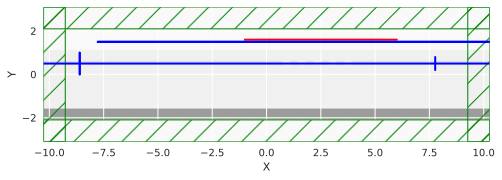

In [21]:
# run simulation
# monitor point
mpt = mp.Vector3(0.5 * sx - dpml - 1, output_waveguide_geo.center.y)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(
    mp.at_every(1, Animate),
    until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
)

In [22]:
Animate.to_jshtml(fps=1)

## Plot the wg field distribution

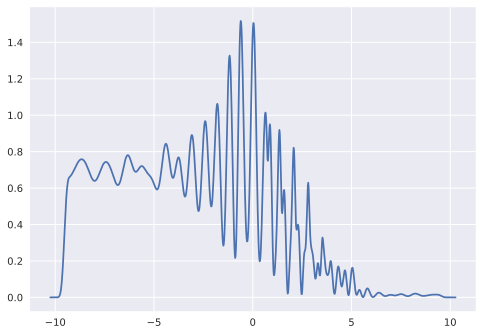

In [23]:
wg_field_data = sim.get_dft_array(wg_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=wg_dft)
plt.plot(x, np.abs(wg_field_data)**2)

## get mode date

In [24]:
# input mode
input_mode = sim.get_eigenmode_coefficients(src_flux, [1], eig_parity=mp.EVEN_Y)
input_flux = mp.get_fluxes(src_flux)
print(abs(input_mode.alpha[0, 0, 1]) ** 2)
print(input_flux)


0.2605832528126174
[-0.28815474239409955]


Text(0.5, 1.0, '$ E_z $ of input mode at 785nm wavelength')

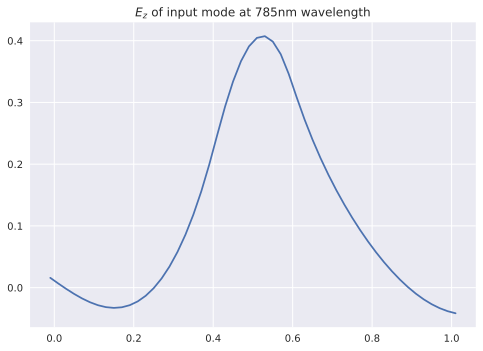

In [32]:
input_dft = sim.get_dft_array(src_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=src_dft)
plt.plot(y, input_dft)
plt.title(r'$ E_z $ of input mode at 785nm wavelength')

## near field mode

In [35]:
near_field_flux = mp.get_fluxes(near_field)
print(f'The power of near_field is {near_field_flux}')


The power of near_field is [-0.7225369954473202]


**Ez in the near field**

Text(0, 0.5, '$ E_z $')

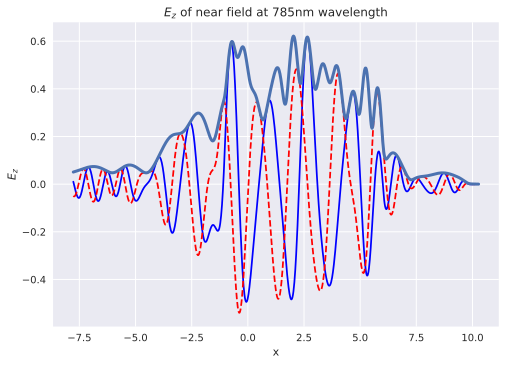

In [27]:
output_dft = sim.get_dft_array(near_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_dft)

figure, ax = plt.subplots()
plt.plot(x, np.real(output_dft), "-b")
plt.plot(x, np.imag(output_dft), "--r")
# plt.plot(x, np.angle(output_dft), '--r')
plt.plot(x, np.abs(output_dft), linewidth=3)

plt.title(r"$ E_z $ of near field at 785nm wavelength")
ax.set_xlabel("x")
ax.set_ylabel(r"$ E_z $")

In [28]:
# shift_output_dft = np.roll(output_dft, 100)
# np.abs(np.sum(np.squeeze(output_dft) * np.conj(output_dft)))

79.33239467316017

**DFT of near field**

ValueError: x and y must have same first dimension, but have shapes (1,) and (903,)

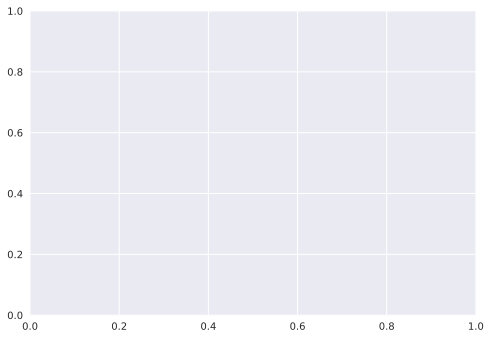

In [36]:
# dft ot near field
# FFT变换 from near field
kx = np.fft.fftshift(np.fft.fftfreq(len(x), grid))
near_field_fft = np.fft.fftshift(np.fft.fft(output_dft))

k = 1 / wvl
kx[np.abs(kx) > k] = np.nan
angle = np.arcsin(kx / k) * 180 / np.pi

figure, ax = plt.subplots()
plt.plot(angle, np.abs(near_field_fft) ** 2, "-o")
plt.title(r"$ Ez $ of DFT")
ax.set_xlabel("angle")
ax.set_ylabel(r"$ E_z $")
ax.set_xlim(-90, 90)

max_index = np.argmax(np.abs(near_field_fft) ** 2)
print(f"The angle of maximum intensity is {angle[max_index]}")

**far field**

Output_angle of grating coupler: -25.229231074859637 degree


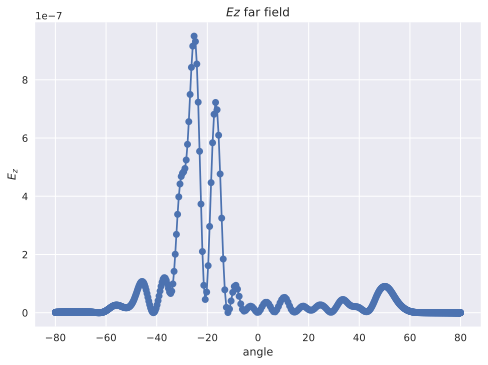

In [37]:
ff_distance = 1e6  # far-field distance from near-field monitor
ff_angle = 80  # far-field cone angle
ff_npts = 1000  # number of far-field points
# single-side far-field length
ff_length = ff_distance * math.tan(math.radians(ff_angle))  # far-field length
# [-ff_length, ff_length]
ff_lengths = np.linspace(-ff_length, ff_length, ff_npts)  # far-field lengths
# resolution
ff_res = ff_npts / (2 * ff_length)  # far-field length resolution

ff = sim.get_farfields(
    n2f_field,
    ff_res,
    center=mp.Vector3(0, ff_distance),
    size=mp.Vector3(x=2 * ff_length),
)
# [-angle, angle]
angles = [math.degrees(math.atan(f)) for f in ff_lengths / ff_distance]
rel_enh = np.abs(ff["Ez"]) ** 2
# rel_enh = np.angle(ff["Ez"])

figure, ax = plt.subplots()
plt.plot(angles, rel_enh, "-o")
plt.title(r"$ Ez $ far field")
ax.set_xlabel("angle")
ax.set_ylabel(r"$ E_z $")

index = np.argmax(rel_enh)
print(f"Output_angle of grating coupler: {angles[index]} degree")

**Verify different angle source**

/home/suda/miniconda3/envs/mp/lib/python3.11/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/suda/miniconda3/envs/mp/lib/python3.11/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


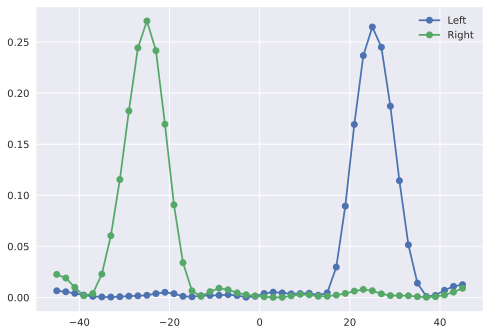

In [3]:
# import simulation results from file 'base_simulation_Gs_back.py'
port_left_fluxes = np.load("port_left_fluxes.npy")
port_right_fluxes = np.load("port_right_fluxes.npy")
angles = np.load("angles.npy")
plt.plot(angles, np.abs(port_left_fluxes), "-o", label="Left")
plt.plot(angles, np.abs(port_right_fluxes), "-o", label="Right")
plt.legend()